In [1]:
import requests
from dotenv import load_dotenv
import yfinance as yf
import alpaca_trade_api as tradeapi
import pandas as pd
import numpy as np
import seaborn as sns

import panel as pn
from panel.interact import interact
from panel import widgets
from ipywidgets import interact, interactive, fixed, interact_manual
import ipywidgets as widgets
#import plotly.express as px
import matplotlib.pyplot as plt
from pathlib import Path
import panel.widgets as pnw
%matplotlib notebook

pn.extension('plotly') ###make sure this is above the hvplot

import hvplot.pandas
from pandas import DataFrame

In [2]:
load_dotenv()

True

In [3]:
ticker_list = ['^GSPC','^IXIC','MSCI','ETH-USD','BCH-USD','BTC-USD','ADA-USD','DASH-USD','LTC-USD']

In [4]:
def tickerListGrab(ticker_list, period="5y"):
    #create empty DataFrame
    df_price = pd.DataFrame()
    df_return = pd.DataFrame()
    #loop through list
    for ticker in ticker_list:
        out = [0]
        # get data from Yahoo Finance
        symbol = yf.Ticker(ticker)
        symbol_hist = symbol.history(period=period)
        # drop unnecessary columns
        symbol_hist = symbol_hist.drop(["Dividends","Stock Splits"],axis = 1)
        # drop NA
        symbol_hist = symbol_hist.dropna()
        # sort data by Date(ascending)
        symbol_hist = symbol_hist.sort_index(ascending=True)
        # calculate return for each symbol
        for i in range(len(symbol_hist)-1):
            out.append((symbol_hist['Close'][i+1]-symbol_hist['Close'][i])/symbol_hist['Close'][i])
        symbol_hist['Return'] = out
        # labeling
#        symbol_hist['Name'] = ticker
        # append to the main DataFrame
        df_price = pd.concat([df_price,symbol_hist['Close']],axis=1)
        df_return = pd.concat([df_return,symbol_hist['Return']],axis=1)
        df_price = df_price.rename(columns={'Close':ticker+'_Close'})
        df_return = df_return.rename(columns={'Return':ticker+'_Return'})
        #df_price = df_price.sort_index(ascending=False)
        #df_return = df_return.sort_index(ascending=False)
#        symbol_hist.to_csv(f"{ticker}_hist.csv")
        # dropna
    df_price = df_price.dropna()
    df_return = df_return.dropna()
    return df_price,df_return

In [5]:
df_price,df_return = tickerListGrab(ticker_list)

In [6]:
#crypto dataframe only
crypto_df=df_price.drop(["^GSPC_Close","^IXIC_Close","MSCI_Close"], axis=1)

In [7]:
#stock datafram only
stock_df=df_price.drop(["ETH-USD_Close","BCH-USD_Close","BTC-USD_Close","ADA-USD_Close","DASH-USD_Close","LTC-USD_Close"], axis=1)

In [8]:
portfolio_price = df_price.tail(1)

In [9]:
pn.widgets.DataFrame(portfolio_price, autosize_mode='fit_viewport')

DataFrame(autosize_mode='fit_viewport', value=              ...)

In [10]:
ticker_price_plot = df_price.hvplot.line(title = 'Index and Crypto Price')
ticker_price_plot

:NdOverlay   [Variable]
   :Curve   [index]   (value)

In [11]:
ticker_return_plot = df_return.hvplot.line(title = 'Index and Crypto Annual Return', shared_axes=False)
ticker_return_plot

:NdOverlay   [Variable]
   :Curve   [index]   (value)

In [12]:
#heatmaps

In [13]:
price_heat = df_price.pct_change().corr().hvplot.heatmap(clim=(-1,1),rot=90,cmap="YlGnBu")

In [14]:
crypto_heat = crypto_df.pct_change().corr().hvplot.heatmap(clim=(-1,1),rot=90,cmap="BuPu")

In [15]:
stock_heat = stock_df.pct_change().corr().hvplot.heatmap(clim=(-1,1),rot=90,cmap="Greens")

In [16]:
annual_returns = df_price.pct_change().mean()*252
annual_returns

^GSPC_Close       0.165098
^IXIC_Close       0.241028
MSCI_Close        0.462275
ETH-USD_Close     1.110727
BCH-USD_Close     0.992502
BTC-USD_Close     0.919872
ADA-USD_Close     2.312120
DASH-USD_Close    0.512942
LTC-USD_Close     0.921354
dtype: float64

In [17]:
annual_return_plot = annual_returns.hvplot(kind = 'bar', rot = 90, title = "Total Annual Returns")
annual_return_plot

:Bars   [index]   (0)

In [18]:
daily_returns = df_price.pct_change()

In [19]:
daily_retuns_plot_all=daily_returns.hvplot()
daily_retuns_plot_all

:NdOverlay   [Variable]
   :Curve   [index]   (value)

In [20]:
#rolling volatility 
##crypto looks like a roller-coaster.

rolling_daily_all_200=daily_returns.rolling(200).std() * np.sqrt(200)
rolling_daily_all_200.hvplot(title = "Total Portfolio - Rolling 200 Day")

:NdOverlay   [Variable]
   :Curve   [index]   (value)

In [21]:
crypto_daily_returns = crypto_df.pct_change()

In [22]:
crypto_rolling_200 = crypto_daily_returns.rolling(200).std() * np.sqrt(200)
crypto_rolling_200.hvplot(title = "Crytp Portfolio - Rolling 200 Day")

:NdOverlay   [Variable]
   :Curve   [index]   (value)

In [23]:
stock_daily_returns = stock_df.pct_change()

In [24]:
# note y-index is much tighter, so this is alot less volatiltiy than comapred to crypto if just viewing graphs

stock_rolling_200 = stock_daily_returns.rolling(200).std() * np.sqrt(200)
stock_rolling_200.hvplot(title = "Stock Portfolio - Rolling 200 Day")

:NdOverlay   [Variable]
   :Curve   [index]   (value)

### Covariance

Covariance tells us the relationship between the variables. We are trying to find if there is a linear relationship between assets.

For example, if bitcoin gains 5%, how do the returns of sp500 correspond to it? Does it also gain 5%? Or does it show no response to it? That is one way to think about covariance. Let’s see their annual 

In [25]:
annual_cov = daily_returns.cov() * 252
annual_cov

corr = annual_cov.corr()
portfolio_covariance = corr.style.background_gradient(cmap='coolwarm')
portfolio_covariance
# 'RdBu_r' & 'BrBG' are other good diverging colormaps

,^GSPC_Close,^IXIC_Close,MSCI_Close,ETH-USD_Close,BCH-USD_Close,BTC-USD_Close,ADA-USD_Close,DASH-USD_Close,LTC-USD_Close
^GSPC_Close,1.000000,0.985201,0.695616,-0.235132,-0.441124,-0.414480,0.209781,-0.462391,-0.272973
^IXIC_Close,0.985201,1.000000,0.722866,-0.255217,-0.479916,-0.419164,0.171956,-0.484293,-0.274469
MSCI_Close,0.695616,0.722866,1.000000,-0.596764,-0.636035,-0.676453,-0.332545,-0.653258,-0.580446
ETH-USD_Close,-0.235132,-0.255217,-0.596764,1.000000,0.867413,0.944956,0.733156,0.877422,0.951036
BCH-USD_Close,-0.441124,-0.479916,-0.636035,0.867413,1.000000,0.853511,0.564053,0.894376,0.832007
BTC-USD_Close,-0.414480,-0.419164,-0.676453,0.944956,0.853511,1.000000,0.723144,0.876165,0.932091
ADA-USD_Close,0.209781,0.171956,-0.332545,0.733156,0.564053,0.723144,1.000000,0.636133,0.694856
DASH-USD_Close,-0.462391,-0.484293,-0.653258,0.877422,0.894376,0.876165,0.636133,1.000000,0.856619
LTC-USD_Close,-0.272973,-0.274469,-0.580446,0.951036,0.832007,0.932091,0.694856,0.856619,1.000000


In [26]:
annual_crypto_cov=crypto_daily_returns.cov() * 252
annual_crypto_cov

corr = annual_crypto_cov.corr()
crypto_covariance = corr.style.background_gradient(cmap='coolwarm')
crypto_covariance

,ETH-USD_Close,BCH-USD_Close,BTC-USD_Close,ADA-USD_Close,DASH-USD_Close,LTC-USD_Close
ETH-USD_Close,1.000000,0.366786,0.073593,0.448315,0.191109,0.577193
BCH-USD_Close,0.366786,1.000000,0.160031,0.006225,0.568345,0.207287
BTC-USD_Close,0.073593,0.160031,1.000000,0.718459,-0.231977,0.143377
ADA-USD_Close,0.448315,0.006225,0.718459,1.000000,0.131657,0.289462
DASH-USD_Close,0.191109,0.568345,-0.231977,0.131657,1.000000,0.129229
LTC-USD_Close,0.577193,0.207287,0.143377,0.289462,0.129229,1.000000


In [27]:
annual_stock_cov=stock_daily_returns.cov() * 252
annual_stock_cov

corr = annual_stock_cov.corr()
stock_covariance = corr.style.background_gradient(cmap='coolwarm')
stock_covariance
# 'RdBu_r' & 'BrBG' are other good diverging colormaps

,^GSPC_Close,^IXIC_Close,MSCI_Close
^GSPC_Close,1.000000,0.934612,0.970109
^IXIC_Close,0.934612,1.000000,0.820365
MSCI_Close,0.970109,0.820365,1.000000


* The variance of sp500 is 0.036586. The variance of bitcoin is 0.5960695. 
* The covariance between bitcoin and sp500 is 0.024520 At this point in time, we can only tell that a positive covariance value means there is a positive linear relationship. 

However, it does not tell us anything about the gradient of the slope or the strength of the 
relationship. In order to do so, we need to calculate the correlation.

### Correlation
* Correlation tells us how strong a relationship between the variables is. 
* The values are between -1 to 1. 
* A value of -1 means it is perfectly negatively correlated. 0 means no correlation and 1 means perfectly positively correlated.


In [28]:
portfolio_corr = daily_returns.corr()
portfolio_corr

,^GSPC_Close,^IXIC_Close,MSCI_Close,ETH-USD_Close,BCH-USD_Close,BTC-USD_Close,ADA-USD_Close,DASH-USD_Close,LTC-USD_Close
^GSPC_Close,1.000000,0.947941,0.725348,0.220373,0.128966,0.192641,0.151523,0.137055,0.183664
^IXIC_Close,0.947941,1.000000,0.742965,0.221011,0.123817,0.197911,0.151092,0.136304,0.189973
MSCI_Close,0.725348,0.742965,1.000000,0.139399,0.069759,0.121765,0.087341,0.082688,0.126896
ETH-USD_Close,0.220373,0.221011,0.139399,1.000000,0.660495,0.706409,0.547085,0.642800,0.763774
BCH-USD_Close,0.128966,0.123817,0.069759,0.660495,1.000000,0.596540,0.424693,0.684294,0.610629
BTC-USD_Close,0.192641,0.197911,0.121765,0.706409,0.596540,1.000000,0.497299,0.607119,0.688786
ADA-USD_Close,0.151523,0.151092,0.087341,0.547085,0.424693,0.497299,1.000000,0.468194,0.509276
DASH-USD_Close,0.137055,0.136304,0.082688,0.642800,0.684294,0.607119,0.468194,1.000000,0.622658
LTC-USD_Close,0.183664,0.189973,0.126896,0.763774,0.610629,0.688786,0.509276,0.622658,1.000000


* Correlation between sp500 and bitcoin is 0.166047 or 16.6%, which is a low correlation. 
* Note that we are comparing the correlation between the assets’ returns rather than the price movement.
* Another thing is that we don’t multiply by 252 trading days. This is because there is no average daily correlation value here. We are just trying to find out the correlation between both assets across the entire data set.

Is it surprising to see such a low correlation? Well, the earlier two price chart says it all. sp500 returns (stocks) pale in comparison to bitcoin (crpyto), drastically.

You might ask, why do we need to calculate the covariance or correlation?

This is because the volatility of one’s portfolio depends on three things.

1. The standard deviation of the individual assets
2. Weight of the assets
3. Covariance between the assets

Hence, the covariance value is one of the inputs that we need to calculate portfolio volatility. The lower the covariance between the two assets, the lower the volatility. This is because they do not move in tandem. Generally speaking, a portfolio of assets that have a high correlation or covariance between one another usually has higher volatility.

In [29]:
stock_corr = stock_daily_returns.corr()

In [30]:
crypto_corr = crypto_daily_returns.corr()

In [31]:
# Volatility tells us the riskiness of an asset
#Standard deviation is the statistical measure of market volatility, measuring how widely prices are dispersed from 
#the average price. ... Conversely, if prices swing wildly up and down, then standard deviation returns a high value that 
#indicates high volatility.
# The wider the tower on the histogram, the more volatile the asset will be.

In [32]:
#Crypto portfolio shows that BTC is the least volatile compared to the other crypto assets.

crypto_volatility = crypto_daily_returns.std() * 252**.5
crytp_std = crypto_volatility.hvplot(rot = 45, title = 'Crypto Standard Devaition - Daily Returns')

In [33]:
#Stock portfolio shows to be much less risky and volatile. showing around 24-35% volatility

stock_volatility = stock_daily_returns.std() * 252**.5
stock_std = stock_volatility.hvplot(title = 'Stock Standard Devaition - Daily Returns')

In [34]:
#The full portfolio shows that the volatility of the selected assets are diversified showing crypto assets as the most 
#volatile assets in the portfolio

full_volatility = daily_returns.std() * 252**.5
portfolio_std = full_volatility.hvplot(rot = 45, title = 'Portfolio Standard Deviation - Daily Returns')

In [35]:
name = pnw.MultiSelect(options=list(crypto_daily_returns.columns.values))
ax = crypto_daily_returns.hvplot.hist(y=name,bins=75,alpha=0.6,bin_range=(-0.3, 0.3),ylim=(0,150), title = 'Crytpo Histogram - Daily Returns')
crypto_histogram = pn.Row(pn.WidgetBox(name), ax)

#We can see the volatility level of the crypto assets based on the wideness of the histogram

In [36]:
crypto_histogram

Row
    [0] WidgetBox
        [0] MultiSelect(options=['ETH-USD_Close', ...])
    [1] ParamFunction(function)

In [37]:
name = pnw.MultiSelect(options=list(stock_daily_returns.columns.values))
ax = stock_daily_returns.hvplot.hist(y=name,bins=75,alpha=0.6,bin_range=(-0.3, 0.3),ylim=(0,400), title = 'Stock Histogram - Daily Returns')
stock_histogram = pn.Row(pn.WidgetBox(name), ax)

In [38]:
stock_histogram

Row
    [0] WidgetBox
        [0] MultiSelect(options=['^GSPC_Close', ...])
    [1] ParamFunction(function)

In [39]:
name = pnw.MultiSelect(options=list(daily_returns.columns.values))
ax = daily_returns.hvplot.hist(y=name,bins=75,alpha=0.6,bin_range=(-0.3, 0.3),ylim=(0,400), title = 'Portfolio Histogram - Daily Returns')
portfolio_histogram = pn.Row(pn.WidgetBox(name), ax)

#We can plot out the price returns on a histogram chart. The wider the distribution the more volatile it is. 
#You can see that sp500 is mostly within the mean distribution. But cardano spreads widely across the x-axis. Sometimes 
#the returns can be 10%,15% or 20%. But you will never see a day sp500 up 15%.

In [40]:
portfolio_histogram

Row
    [0] WidgetBox
        [0] MultiSelect(options=['^GSPC_Close', ...])
    [1] ParamFunction(function)

In [41]:
#Sharpe Ratios

In [42]:
# Full Portfolio Sharpe Ratio
final_sharpe_Ratio = daily_returns.mean() / daily_returns.std()
final_sharpe_Ratio

^GSPC_Close       0.048152
^IXIC_Close       0.062731
MSCI_Close        0.083106
ETH-USD_Close     0.068694
BCH-USD_Close     0.046413
BTC-USD_Close     0.073376
ADA-USD_Close     0.083833
DASH-USD_Close    0.027793
LTC-USD_Close     0.052263
dtype: float64

In [43]:
annualized_sharpe_ratio = (252 ** 0.5) * final_sharpe_Ratio
annualized_sharpe_ratio

^GSPC_Close       0.764392
^IXIC_Close       0.995817
MSCI_Close        1.319266
ETH-USD_Close     1.090486
BCH-USD_Close     0.736787
BTC-USD_Close     1.164815
ADA-USD_Close     1.330809
DASH-USD_Close    0.441202
LTC-USD_Close     0.829645
dtype: float64

In [44]:
sharpe_sum = final_sharpe_Ratio.sum()
average_portfolio_sharpe_ratio = sharpe_sum / 9
average_portfolio_sharpe_ratio

0.060706832500330855

In [45]:
sharpe_portfolio = annualized_sharpe_ratio.hvplot.bar(title='Annualized Sharpe Ratio', rot = 45, shared_axes=False)

In [46]:
# Stock Portfolio Sharpe Ratio
stock_sharpe_ratio= stock_daily_returns.mean() / stock_daily_returns.std()
stock_sharpe_ratio

^GSPC_Close    0.048152
^IXIC_Close    0.062731
MSCI_Close     0.083106
dtype: float64

In [47]:
stock_annualized_sharpe=(252 ** 0.5) * stock_sharpe_ratio
stock_annualized_sharpe

^GSPC_Close    0.764392
^IXIC_Close    0.995817
MSCI_Close     1.319266
dtype: float64

In [48]:
stock_annualized_sharpe_final = stock_annualized_sharpe.sum() / 3
stock_annualized_sharpe_final

1.026491667059947

In [49]:
sharpe_stock = stock_sharpe_ratio.hvplot.bar(title='Annualized Sharpe Ratio', rot = 45, shared_axes=False)

In [50]:
# Crypto Portfolio Sharpe Ratio
crypto_sharpe= crypto_daily_returns.mean() / crypto_daily_returns.std()
crypto_sharpe

ETH-USD_Close     0.068694
BCH-USD_Close     0.046413
BTC-USD_Close     0.073376
ADA-USD_Close     0.083833
DASH-USD_Close    0.027793
LTC-USD_Close     0.052263
dtype: float64

In [51]:
crypto_annualized_sharpe = (252 ** 0.5) * crypto_sharpe
crypto_annualized_sharpe

ETH-USD_Close     1.090486
BCH-USD_Close     0.736787
BTC-USD_Close     1.164815
ADA-USD_Close     1.330809
DASH-USD_Close    0.441202
LTC-USD_Close     0.829645
dtype: float64

In [52]:
crypto_daily_sharpe=crypto_sharpe.sum() / 6
crypto_daily_sharpe

0.05872880025143996

In [53]:
crypto_annual_sharpe = crypto_annualized_sharpe.sum() / 6
crypto_annual_sharpe

0.9322908015749863

In [54]:
sharpe_crypto = crypto_annualized_sharpe.hvplot.bar(title= 'Crypto Annualized Sharpe Ratio', rot = 45, shared_axes=False)

In [55]:
#### *******Last Panel****** 
#### We tell viewer what we think is ideal portfolio based on best performing stock index and crypto

The objective goal of Team1 is to help assist you to determine appropriate weights of the hgihest performing stock index (MSCI) and highest crpto (Cardano), in order to achieve your ideal portfolio.

The folowiing will tell you where the Sharpe ratio is the highest. That is the point where the adjusted-risk return is the maximum. We will use the following analysis to tell us the weights of the assets at this particular point.

In [56]:
iterations = 1000
results = np.zeros((5,iterations))
results

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

In [57]:
weighted_portfolio = df_price[['^IXIC_Close','ADA-USD_Close']]
weighted_portfolio.head()

,^IXIC_Close,ADA-USD_Close
2017-10-02 00:00:00,6516.720215,0.025932
2017-10-03 00:00:00,6531.709961,0.020816
2017-10-04 00:00:00,6534.629883,0.021931
2017-10-05 00:00:00,6585.359863,0.021489
2017-10-06 00:00:00,6590.180176,0.018539


In [58]:
weighted_annual_returns = weighted_portfolio.pct_change().mean() * 252
weighted_annual_returns

^IXIC_Close      0.241028
ADA-USD_Close    2.312120
dtype: float64

In [59]:
#assets = weighted_portfolio[['nasdaq price','cardano price']]
assets = ['^IXIC_Close','ADA-USD_Close']
assets

['^IXIC_Close', 'ADA-USD_Close']

In [60]:
weighted_daily_returns = weighted_portfolio.pct_change()
weighted_daily_returns

,^IXIC_Close,ADA-USD_Close
2017-10-02,NaN,NaN
2017-10-03,0.002300,-0.197285
2017-10-04,0.000447,0.053565
2017-10-05,0.007763,-0.020154
2017-10-06,0.000732,-0.137280
...,...,...
2021-06-08,0.003111,0.015296
2021-06-09,-0.000945,0.023171
2021-06-10,0.007805,-0.057218
2021-06-11,0.003501,-0.062329


In [61]:
weighted_annual_cov = weighted_daily_returns.cov() * 252
weighted_annual_cov

,^IXIC_Close,ADA-USD_Close
^IXIC_Close,0.058584,0.063537
ADA-USD_Close,0.063537,3.018485


In [62]:
for i in range(iterations):
    weights = np.random.random(len(assets))
    weights /= np.sum(weights)
    
    portfolio_return = np.dot(weighted_annual_returns, weights)
    portfolio_volatility = np.sqrt(np.dot(weights.T, np.dot(weighted_annual_cov, weights)))
    
    results[0,i] = portfolio_return
    results[1,i] = portfolio_volatility
    results[2,i] = results[0,i] / results[1,i]
    results[3,i] = weights[0]
    results[4,i] = weights[1]

In [63]:
weighted_results = pd.DataFrame(results.T,columns=['returns','stdev','sharpe','^IXIC','ADA-USD'])
weighted_results.sort_values(by='returns')

,returns,stdev,sharpe,^IXIC,ADA-USD
400,0.247598,0.242167,1.022427,0.996828,0.003172
919,0.247615,0.242167,1.022497,0.996819,0.003181
956,0.250879,0.242276,1.035513,0.995243,0.004757
921,0.251293,0.242291,1.037153,0.995044,0.004956
953,0.252499,0.242341,1.041916,0.994462,0.005538
...,...,...,...,...,...
618,2.304813,1.731379,1.331201,0.003528,0.996472
783,2.305510,1.731951,1.331164,0.003191,0.996809
546,2.306352,1.732642,1.331119,0.002785,0.997215
528,2.306916,1.733105,1.331088,0.002512,0.997488


* The highest return is 231% with a 99.8% weight in Cardano. 

However, that also means the portfolio volatility is 174%, which is extremly risky. On the other hand, the lowest return is 23.3% with a 99.8% weight in nasdaq. The volatility is only 21.6%.

Plotting out all the data points of 1000 different weight combinations, we can find out the exact point where the Sharpe ratio is the highest.

### The Sharpe ratio is the point where the adjusted-risk return is the highest.

In [64]:
max_sharpe = weighted_results.iloc[weighted_results['sharpe'].idxmax()]

In [65]:
marker = weighted_results[weighted_results['sharpe'] == weighted_results['sharpe'].max()].hvplot.scatter(x='stdev',y='returns').opts(color='orange', size=50, marker='x')
scatter = weighted_results.hvplot.scatter(x='stdev',y='returns',c='sharpe',cmap='bgy')
max_sharpe_scatter = scatter * marker
max_sharpe_scatter

:Overlay
   .Scatter.I  :Scatter   [stdev]   (returns,sharpe)
   .Scatter.II :Scatter   [stdev]   (returns)

In [66]:
ideal_returns=max_sharpe[0]
ideal_returns

0.5960768372755307

In [67]:
ideal_std=max_sharpe[1]
ideal_std

0.38337675027265594

In [68]:
msci_weight=max_sharpe[3]
msci_weight

0.82856926895656

In [69]:
cardano_weight=max_sharpe[4]
cardano_weight

0.17143073104344006

In [70]:
msci_weight + cardano_weight

1.0

In [71]:
ideal_portfolio = f'The optimal weight based on 5-years of price returns, statistics, modern portfolio theories, mathematics, and previous anaylsis is {round(msci_weight*100,2)}% MSCI/Nasdaq and {round(cardano_weight*100,2)}% Cardano. This weighted allocation would give an average return of about {round(ideal_returns*100,2)}%, with std/volatility of about {round(ideal_std*100,2)}%. You achieve higher returns with exposure to Cardano (crypto), but your risk is also mitigated by having a heavier weight in nasdaq (stocks).'

In [72]:
ideal_portfolio

'The optimal weight based on 5-years of price returns, statistics, modern portfolio theories, mathematics, and previous anaylsis is 82.86% MSCI/Nasdaq and 17.14% Cardano. This weighted allocation would give an average return of about 59.61%, with std/volatility of about 38.34%. You achieve higher returns with exposure to Cardano (crypto), but your risk is also mitigated by having a heavier weight in nasdaq (stocks).'

In [73]:
highest_stock_crypto = df_price[['MSCI_Close', 'ADA-USD_Close']]
highest_stock_crypto.head()

,MSCI_Close,ADA-USD_Close
2017-10-02 00:00:00,112.523842,0.025932
2017-10-03 00:00:00,113.995552,0.020816
2017-10-04 00:00:00,115.563446,0.021931
2017-10-05 00:00:00,116.486870,0.021489
2017-10-06 00:00:00,116.660034,0.018539


In [74]:
#Ted's code to make mc work
highest_stock_crypto.columns=pd.MultiIndex.from_tuples(map(lambda x: (x[1], 'close'), highest_stock_crypto.columns))
highest_stock_crypto

,S,D
,close,close
2017-10-02,112.523842,0.025932
2017-10-03,113.995552,0.020816
2017-10-04,115.563446,0.021931
2017-10-05,116.486870,0.021489
2017-10-06,116.660034,0.018539
...,...,...
2021-06-08,463.369995,1.588030
2021-06-09,465.829987,1.624826
2021-06-10,476.459991,1.531857


In [75]:
from MCForecastTools import MCSimulation

In [76]:
mc_fiveyear = MCSimulation(highest_stock_crypto, [msci_weight,cardano_weight], 500, 252*5)
mc_fiveyear.portfolio_data.head()

S                      D             
                          close daily_return     close daily_return
2017-10-02 00:00:00  112.523842          NaN  0.025932          NaN
2017-10-03 00:00:00  113.995552     0.013079  0.020816    -0.197285
2017-10-04 00:00:00  115.563446     0.013754  0.021931     0.053565
2017-10-05 00:00:00  116.486870     0.007991  0.021489    -0.020154
2017-10-06 00:00:00  116.660034     0.001487  0.018539    -0.137280

In [77]:
mc_fiveyear.calc_cumulative_return()

Running Monte Carlo simulation number 0.
Running Monte Carlo simulation number 10.
Running Monte Carlo simulation number 20.
Running Monte Carlo simulation number 30.
Running Monte Carlo simulation number 40.
Running Monte Carlo simulation number 50.
Running Monte Carlo simulation number 60.
Running Monte Carlo simulation number 70.
Running Monte Carlo simulation number 80.
Running Monte Carlo simulation number 90.
Running Monte Carlo simulation number 100.
Running Monte Carlo simulation number 110.
Running Monte Carlo simulation number 120.
Running Monte Carlo simulation number 130.
Running Monte Carlo simulation number 140.
Running Monte Carlo simulation number 150.
Running Monte Carlo simulation number 160.
Running Monte Carlo simulation number 170.
Running Monte Carlo simulation number 180.
Running Monte Carlo simulation number 190.
Running Monte Carlo simulation number 200.
Running Monte Carlo simulation number 210.
Running Monte Carlo simulation number 220.
Running Monte Carlo si

,0,1,2,3,4,5,6,7,8,9,...,490,491,492,493,494,495,496,497,498,499
0,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
1,0.951294,1.034958,0.983423,1.039930,0.962032,0.982063,0.978233,0.947569,0.982385,1.029885,...,1.017446,1.018134,0.998210,0.939713,0.997181,0.986622,1.012685,1.057312,1.037545,1.001448
2,0.920198,1.025458,1.022312,1.035342,0.995651,1.009782,1.023577,0.925518,1.028067,1.056793,...,1.003720,1.020349,1.017894,0.968095,1.011531,0.993847,0.995503,1.073676,1.043831,0.975464
3,0.909450,0.993582,0.992943,1.088157,0.979002,0.999092,1.024806,0.933817,0.994628,1.040450,...,1.040889,1.043611,0.986090,0.993116,1.000093,1.036013,0.950702,1.117068,1.014478,0.984816
4,0.890353,1.023494,0.997264,1.097318,0.944353,0.984184,1.050309,0.920544,1.027350,1.065825,...,1.054889,1.049822,0.994978,1.010096,1.024116,1.019908,1.018538,1.159536,1.077171,0.981964
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1256,12.074873,16.917463,18.729998,13.946765,16.599342,74.233027,56.952498,60.544665,80.231549,11.595660,...,35.886769,12.114618,43.646218,48.866067,18.075502,14.924296,17.486054,60.734766,17.924523,9.636047
1257,12.265154,16.514890,18.632594,13.201222,16.617697,73.880115,57.928182,61.759517,81.465688,11.977641,...,35.488971,12.103663,44.659093,49.854161,18.075046,14.418228,17.164748,63.684165,18.324763,9.960578
1258,12.257658,17.525852,18.433422,13.382072,16.094264,75.081608,56.399760,62.561997,79.722022,12.104073,...,34.275019,12.115729,46.625632,51.342019,17.906522,14.671828,16.573040,60.162374,17.523227,9.511671
1259,12.536185,17.444903,18.697586,13.312085,16.085606,73.509418,57.590318,62.540530,80.918856,12.475985,...,34.096392,11.980266,45.762111,53.142155,17.836128,14.838562,16.518431,60.690880,17.085032,9.568845


In [78]:
mc_fiveyear.simulated_return.mean(axis=1)

0        1.000000
1        1.004371
2        1.007696
3        1.010191
4        1.016088
          ...    
1256    52.672552
1257    52.724781
1258    52.944774
1259    53.177219
1260    53.478540
Length: 1261, dtype: float64

In [79]:
mc_fiveyear.simulated_return.median(axis=1)

0        1.000000
1        1.004297
2        1.006541
3        1.008719
4        1.016216
          ...    
1256    31.315544
1257    31.332770
1258    31.599820
1259    31.929840
1260    31.656418
Length: 1261, dtype: float64

In [80]:
mc_fiveyear.simulated_return.min(axis=1)

0       1.000000
1       0.927352
2       0.907842
3       0.896361
4       0.873951
          ...   
1256    1.657949
1257    1.709858
1258    1.659187
1259    1.710397
1260    1.731339
Length: 1261, dtype: float64

In [81]:
mc_fiveyear.simulated_return.max(axis=1)

0          1.000000
1          1.091652
2          1.119690
3          1.160832
4          1.184337
           ...     
1256    1028.523626
1257     983.504478
1258     972.496416
1259     963.008529
1260     995.658820
Length: 1261, dtype: float64

<IPython.core.display.Javascript object>


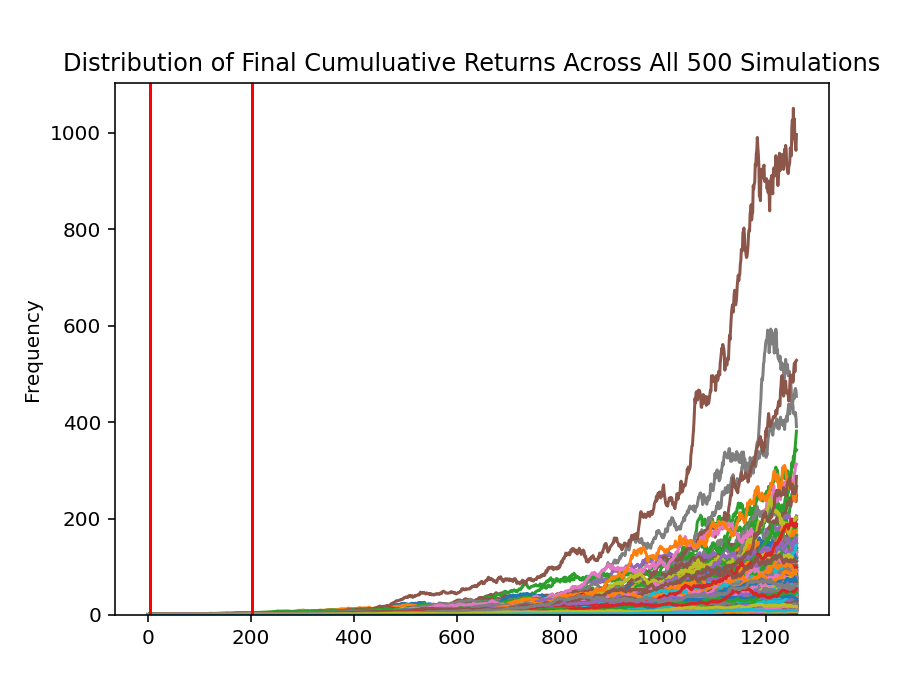

In [82]:
ideal_monte = mc_fiveyear.plot_simulation()

In [83]:
mc_fiveyear.plot_distribution()

<AxesSubplot:title={'center':'Distribution of Final Cumuluative Returns Across All 500 Simulations'}, ylabel='Frequency'>

In [84]:
mc_ideal = mc_fiveyear.summarize_cumulative_return()

In [85]:
mc_ideal

count           500.000000
mean             53.478540
std              73.611359
min               1.731339
25%              16.504278
50%              31.656418
75%              64.957866
max             995.658820
95% CI Lower      5.540561
95% CI Upper    203.406919
Name: 1260, dtype: float64

In [86]:
ci_lower = mc_fiveyear.summarize_cumulative_return()[8]
ci_upper = mc_fiveyear.summarize_cumulative_return()[9]
initial_investment = 1000
ci_lower_dollar = ci_lower*initial_investment
ci_upper_dollar = ci_upper*initial_investment
percent_lower = (ci_lower_dollar - initial_investment) / initial_investment
percent_higher = (ci_upper_dollar - initial_investment) / initial_investment

In [87]:
mc_ideal_output = f"Based on 500 simulations of the ideal portfolio recommended with highest stock index and highest crpyto coin and based on optimal risk weights, there is 95% chance that an intital investment of ${initial_investment} is going to to be between ${round(ci_lower_dollar,2)} and ${round(ci_upper_dollar,2)} over a 5-year period, holding all else constant and given alpha level of 5%. This is a {round(percent_lower*100,2)}% return and {round(percent_higher*100,2)}% return, respectively"

In [88]:
### Viewer can input amount invested, risk tolerance, and timeframe

In [89]:
#risk tolerance slider
risk_slider = pn.widgets.FloatSlider(name='Pls select your Crypto exposure (%) level 0--10 (100% Crypto))', start=1, end=10, step=1.0, width=400)

In [90]:
risk_slider

FloatSlider(end=10, name='Pls select your C..., start=1, step=1.0, value=1, width=400)

In [91]:
risk_slider_val= risk_slider.value

In [92]:
## Portfolio Weight Calculator
def weight_calc (risk_slider_val):
    global crypto_weight
    crypto_weight = (risk_slider_val *.1)
    global stock_weight
    stock_weight = 1-crypto_weight
    return f" Based on your risk tolerance of {risk_slider_val}, your portfolio will be weight adjusted to {round(crypto_weight*100,2)} % crypto, and {round(stock_weight*100,2)} % stocks."

In [93]:
risk_weight = weight_calc(risk_slider_val)


In [94]:
## Defining number of years and sims
def num_collect():
    global port_invest
    port_invest = float(input("Pls enter the number of $ to invest " ))
    global number_years
    number_years= int(input("Pls select the number of years to run " ))
    global number_sims
    number_sims=int(input("Pls select the number of sims to run " ))

In [95]:
num_collect()

Pls enter the number of $ to invest 1750
Pls select the number of years to run 6
Pls select the number of sims to run 100


In [96]:
### Peform the Monte Carlo with the inputs
mc_investor = MCSimulation(highest_stock_crypto, [stock_weight, crypto_weight], number_sims, 252* number_years)
mc_investor.calc_cumulative_return()

Running Monte Carlo simulation number 0.
Running Monte Carlo simulation number 10.
Running Monte Carlo simulation number 20.
Running Monte Carlo simulation number 30.
Running Monte Carlo simulation number 40.
Running Monte Carlo simulation number 50.
Running Monte Carlo simulation number 60.
Running Monte Carlo simulation number 70.
Running Monte Carlo simulation number 80.
Running Monte Carlo simulation number 90.


,0,1,2,3,4,5,6,7,8,9,...,90,91,92,93,94,95,96,97,98,99
0,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
1,1.016803,0.991332,0.992170,1.023454,0.967031,1.010413,0.974455,1.003206,1.004180,0.999691,...,0.974286,0.985875,1.014815,1.002119,0.985723,1.033926,1.032607,0.997715,0.978925,0.979310
2,1.008322,1.030242,0.955152,1.010454,0.988298,0.985263,1.011016,1.011691,0.976445,1.018536,...,0.969706,0.982786,1.016252,1.006588,0.986057,1.040770,1.068764,1.015497,0.998232,0.950346
3,1.011894,1.058103,0.940560,0.964819,0.956904,0.983063,1.007041,1.049419,0.972290,1.001135,...,1.039799,1.011779,1.038789,1.008995,1.019411,1.000695,1.052081,1.014240,1.002500,0.970805
4,1.011812,1.046544,0.891348,0.981794,0.950699,1.004743,1.000020,1.035458,0.955990,1.009306,...,1.026100,1.004196,1.039795,1.009747,1.018753,1.049490,1.073562,1.035107,1.012183,0.956117
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1508,60.138711,50.793988,23.048330,188.873039,75.214322,23.189301,33.047707,19.885282,14.492189,18.020949,...,14.802762,70.069605,72.033096,14.514033,59.778892,42.982495,28.641866,19.808063,22.387537,17.435550
1509,60.185036,51.800999,23.329459,186.145863,75.835201,23.798319,34.139439,19.374050,14.933576,18.121549,...,14.662921,68.267673,73.466462,14.463231,60.698966,44.135661,28.997464,19.930487,22.545095,17.037036
1510,63.664900,53.824373,23.431699,188.156381,75.661467,24.072179,33.392775,19.375685,15.240236,18.324766,...,15.668945,67.790082,73.617094,14.495322,60.965599,43.493258,29.579461,19.271155,23.003358,17.032102
1511,62.892333,54.294732,23.240430,193.372918,75.718570,23.377382,33.987540,19.191613,15.038657,18.735241,...,15.974204,66.974448,74.632184,13.770232,59.412215,43.566785,29.694072,20.077818,23.013664,16.547944


In [97]:
## Summarize the output
mc_pick = mc_investor.summarize_cumulative_return()
mc_pick

count           100.000000
mean             42.203487
std              31.455721
min               5.228292
25%              19.085768
50%              35.919791
75%              58.881211
max             202.172600
95% CI Lower      9.568863
95% CI Upper    106.975185
Name: 1512, dtype: float64

In [98]:
investor_ci_lower = mc_investor.summarize_cumulative_return()[8]
investor_ci_upper = mc_investor.summarize_cumulative_return()[9]
investor_ci_lower_dollar = investor_ci_lower*int(port_invest)
investor_ci_upper_dollar = investor_ci_upper*int(port_invest)
investor_percent_lower = (investor_ci_lower_dollar - int(port_invest)) / int(port_invest)
investor_percent_higher = (investor_ci_upper_dollar - int(port_invest)) / int(port_invest)

<IPython.core.display.Javascript object>


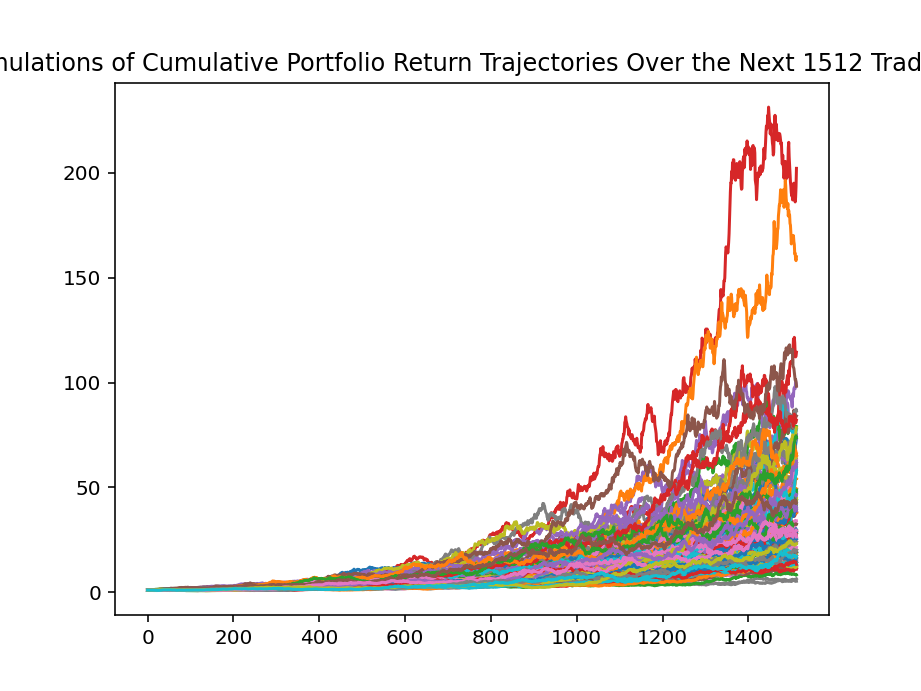

In [99]:
investor_mc_plot = mc_investor.plot_simulation()

In [100]:
## Dashboard & Panel 

In [101]:
team_1_background = pn.Column(
        '##Retirement Portfolio',
        '##Meet the Team!',
        '##Team Leader - Jon Iadonisi',
        pn.pane.JPG('https://res.cloudinary.com/crunchbase-production/image/upload/c_lpad,h_256,w_256,f_auto,q_auto:eco/kolovryb0ui3jn7wkpfz', width=500),
        'linkedin profile: target:https://www.linkedin.com/in/joniadonisi/',
        '##Team Member - Daniel R. Faulks',
        pn.pane.JPG('https://www.advancentx.org/uploads/1/3/5/2/135224485/cr-0023065-daniel-faulks_orig.jpg', width=500),
        'linkedin profile: https://www.linkedin.com/in/daniel-faulks-33b10316/',
        '##Team Member - Fai Kongchai',   
        pn.pane.JPG('https://media-exp3.licdn.com/dms/image/C5103AQFr0qZ1ad4gDA/profile-displayphoto-shrink_800_800/0/1560421804777?e=1628726400&v=beta&t=WqKOu84lpYu8GbZR-9Xu0FzjRLHGdyVN_BsaeOtYGvw', width=500),
        'linkedin profile: https://www.linkedin.com/in/anchitha-kongchai-8b06a769/',
        '##Team Member - Brock Freeman',
        pn.pane.JPG('https://media-exp3.licdn.com/dms/image/C4E03AQE1wUSYUtlhjA/profile-displayphoto-shrink_800_800/0/1609261741766?e=1628726400&v=beta&t=jWG_GvhNqW8m8tayZatM7bY_DEg8RRoZtCCh85w8XUE', width=500),
         'linkedin profile: https://www.linkedin.com/in/brock-freeman-9aa171152/',
       

)

In [102]:
basic_data = pn.Column('##Pricing and Returns',
    ticker_price_plot,
    ticker_return_plot,
    annual_return_plot,
    rolling_daily_all_200.hvplot(title = "Total Portfolio - Rolling 200 Day", shared_axes=False),
    price_heat
)

In [103]:
analysis = pn.Column('##Portfolio Analysis',
    '### Covariance',
    'Covariance tells us the relationship between the variables. We are trying to find if there is a linear relationship between assets.',
    'For example, if bitcoin gains 5%, how do the returns of sp500 correspond to it? Does it also gain 5%? Or does it show no response to it? That is one way to think about covariance. Let’s see their annual',
    '',
    portfolio_covariance,
    '* The covariance between sp500 and bitcoin is -0.44. A positive covariance means that asset returns move together while a negative covariance means they move inversely.', 
    '### Correlation',
    '* Correlation tells us how strong a relationship between the variables is.', 
    '* The values are between -1 to 1.', 
    '* A value of -1 means it is perfectly negatively correlated. 0 means no correlation and 1 means perfectly positively correlated.',
    portfolio_corr,        
    '* Correlation between sp500 and bitcoin is 0.13 or 13%, which is a low correlation.',
    '* Note that we are comparing the correlation between the assets’ returns rather than the price movement.'
    '* Another thing is that we don’t multiply by 252 trading days. This is because there is no average daily correlation value here. We are just trying to find out the correlation between both assets across the entire data set.',
    'Is it surprising to see such a low correlation? Well, the earlier two price chart says it all. SP500 returns (stocks) pale in comparison to bitcoin (crpyto), drastically.',
    '### Standard Deviation & Volatility',
    'Standard deviation is the statistical measure of market volatility, measuring how widely prices are dispersed from the average price. Conversely, if prices swing wildly up and down, then standard deviation returns a high value that indicates high volatility.', 
    portfolio_std,
    '* From the chart above we can see Cardano is very volatile/risky, whereas SP500 is the least volatile/risky.', 
    portfolio_histogram,
    '* The wider the tower on the histogram, the more volatile the asset will be.',
    '### Sharpe Ratio',
    'The sharpe ratio is the average return earned in excess of the risk-free rate per unit of volatility or total risk.',
    'The Sharpe ratio has become the most widely used method for calculating the risk-adjusted return. Modern Portfolio Theory states that adding assets to a diversified portfolio that has low correlations can decrease portfolio risk without sacrificing return.',
    sharpe_portfolio,
                     
                     
)

In [104]:
stock_analysis = pn.Column('##Stock Analysis',
    stock_rolling_200.hvplot(title = "Stock Portfolio - Rolling 200 Day", shared_axes=False),
    '##Heat Map',
    stock_heat,
    '##Covariance',
    stock_covariance,
    '### Correlation',
    stock_corr,
    '### Standard Deviation & Volatility',
    stock_std,
    stock_histogram,
    '### Sharpe Ratio',
    sharpe_stock  
)

In [105]:
crypto_analysis = pn.Column('##Crypto Analysis',
    crypto_rolling_200.hvplot(title = "Crytpo Portfolio - Rolling 200 Day", shared_axes=False),
    '##Heat Map',
    crypto_heat,
    '##Covariance',
    stock_covariance,
    '### Correlation',
    crypto_corr,
    '### Standard Deviation & Volatility',
    crytp_std,
    crypto_histogram,
    '### Sharpe Ratio',
    sharpe_crypto 
)

In [106]:
retirement = pn.Column(
    '#Retirement is Within Reach...',
    pn.pane.JPG('https://travel.home.sndimg.com/content/dam/images/travel/stock/2018/4/10/iStock-672425798.-beach_chairs.jpg.rend.hgtvcom.1280.853.suffix/1523383408931.jpeg', width=500),
    'The objective goal of Team1 is to help assist you in determining the appropriate weights of the hgihest performing stock index (MSCI) and highest crpto (Cardano), in order to achieve your ideal portfolio.',
    '###Below is the ideal portfolio we recommend, to help you achieve your dream retirement.',
    max_sharpe,
    ideal_portfolio,
    max_sharpe_scatter,
    '###Ideal Portfolio Monte Carlo Simulation',
    mc_ideal,
    mc_ideal_output,
    ideal_monte.figure,
    
)

In [117]:
user_inputs = pn.Column(
    '##Pick Your Own Portfolio',
    '###MSCI & Cardano - Pick your portfolio Variables:',
    '* Dollars to be invested',
    port_invest,
    '* Number of years',
    number_years,
    '* Number of Monte Carlo simulations',
    number_sims,
    '* Risk tolerance',
    '### Portfolio Performance With Investor Inputs',
    mc_pick,
   investor_mc_plot.figure,
    
)

In [118]:
conclusion = pn.Column(
    '##Conclusion', 
    'An investor may get back less than the amount invested. Information on past performance, where given, is not necessarily a guide to future performance.',
    '## High Risk Investment - Crypto',
    'Trading cryptocurrencies carries a high level of risk, and may not be suitable for all investors. Before deciding to trade cryptocurrency you should carefully consider your investment objectives, level of experience, and risk appetite. The possibility exists that you could sustain a loss of some or all of your initial investment and therefore you should not invest money that you cannot afford to lose. You should be aware of all the risks associated with cryptocurrency trading, and seek advice from an independent financial advisor.',
    '##Good Luck and Happy Investing... TO THE MOON!',
    pn.pane.GIF('http://i.imgur.com/UgKUChu.gif', width=500),
)

In [119]:
slider = pn.widgets.IntSlider(name='Pls select your Crypto exposure (%) level 0--10 (100% Crypto)', width=400, start=1, end=100)

In [120]:
@pn.depends(slider.param.value)
def slider_range(slider):
    global crypto_weight
    crypto_weight = (slider)
    global stock_weight
    stock_weight = 100-crypto_weight
    return f"### Based on your risk tolerance of {slider} , your portfolio will be weight adjusted to {round(crypto_weight,2)} % crypto, and {round(stock_weight,2)} % stocks."  

In [121]:
row = pn.Row(slider, slider_range)

In [122]:
project_dashboard = pn.Tabs(
    ('Team Members', team_1_background),
    ('Stock & Crypto Data', basic_data),
    ('Portfolio Analysis', analysis),
    ('Stock Analysis', stock_analysis),
    ('Crypto Analysis', crypto_analysis),
    ("Retirement" , retirement),
    ("Risk Slider", row),
    ("Create Your Portfolio" , user_inputs),
    ("Conclusion" , conclusion),
    
)

Tabs
    [0] Column
        [0] Markdown(str)
        [1] Markdown(str)
        [2] Markdown(str)
        [3] JPG(str, width=500)
        [4] Markdown(str)
        [5] Markdown(str)
        [6] JPG(str, width=500)
        [7] Markdown(str)
        [8] Markdown(str)
        [9] JPG(str, width=500)
        [10] Markdown(str)
        [11] Markdown(str)
        [12] JPG(str, width=500)
        [13] Markdown(str)
    [1] Column
        [0] Markdown(str)
        [1] HoloViews(NdOverlay)
        [2] HoloViews(NdOverlay)
        [3] HoloViews(Bars)
        [4] HoloViews(NdOverlay)
        [5] HoloViews(HeatMap)
    [2] Column
        [0] Markdown(str)
        [1] Markdown(str)
        [2] Markdown(str)
        [3] Markdown(str)
        [4] Markdown(str)
        [5] HTML(Styler)
        [6] Markdown(str)
        [7] Markdown(str)
        [8] Markdown(str)
        [9] Markdown(str)
        [10] Markdown(str)
        [11] DataFrame(DataFrame)
        [12] Markdown(str)
        [13] Markdown(str)
        [14] Markdown(str)
        [15] Markdown(str)
        [16] Markdown(str)
        [17] HoloViews(Curve)
        [18] Markdown(str)
        [19] Row
            [0] WidgetBox
                [0] MultiSelect(options=['^GSPC_Close', ...])
            [1] ParamFunction(function)
        [20] Markdown(str)
        [21] Markdown(str)
        [22] Markdown(str)
        [23] Markdown(str)
        [24] HoloViews(Bars)
    [3] Column
        [0] Markdown(str)
        [1] HoloViews(NdOverlay)
        [2] Markdown(str)
        [3] HoloViews(HeatMap)
        [4] Markdown(str)
        [5] HTML(Styler)
        [6] Markdown(str)
        [7] DataFrame(DataFrame)
        [8] Markdown(str)
        [9] HoloViews(Curve)
        [10] Row
            [0] WidgetBox
                [0] MultiSelect(options=['^GSPC_Close', ...])
            [1] ParamFunction(function)
        [11] Markdown(str)
        [12] HoloViews(Bars)
    [4] Column
        [0] Markdown(str)
        [1] HoloViews(NdOverlay)
        [2] Markdown(str)
        [3] HoloViews(HeatMap)
        [4] Markdown(str)
        [5] HTML(Styler)
        [6] Markdown(str)
        [7] DataFrame(DataFrame)
        [8] Markdown(str)
        [9] HoloViews(Curve)
        [10] Row
            [0] WidgetBox
                [0] MultiSelect(options=['ETH-USD_Close', ...])
            [1] ParamFunction(function)
        [11] Markdown(str)
        [12] HoloViews(Bars)
    [5] Column
        [0] Markdown(str)
        [1] JPG(str, width=500)
        [2] Markdown(str)
        [3] Markdown(str)
        [4] DataFrame(Series)
        [5] Markdown(str)
        [6] HoloViews(Overlay)
        [7] Markdown(str)
        [8] DataFrame(Series)
        [9] Markdown(str)
        [10] Matplotlib(Figure)
    [6] Row
        [0] IntSlider(end=100, name='Pls select your C..., start=1, value=1, width=400)
        [1] ParamFunction(function)
    [7] Column
        [0] Markdown(str)
        [1] Markdown(str)
        [2] Markdown(str)
        [3] Str(float)
        [4] Markdown(str)
        [5] Str(int)
        [6] Markdown(str)
        [7] Str(int)
        [8] Markdown(str)
        [9] Markdown(str)
        [10] DataFrame(Series)
        [11] Matplotlib(Figure)
    [8] Column
        [0] Markdown(str)
        [1] Markdown(str)
        [2] Markdown(str)
        [3] Markdown(str)
        [4] Markdown(str)
        [5] GIF(str, width=500)
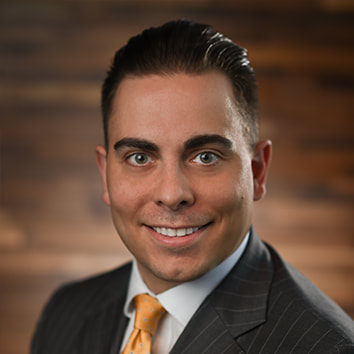
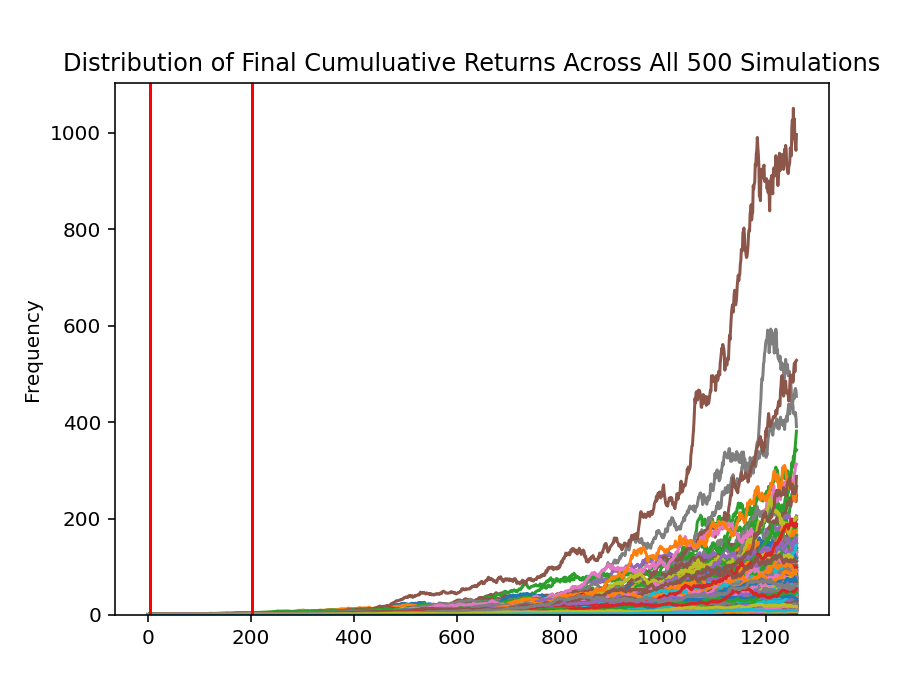
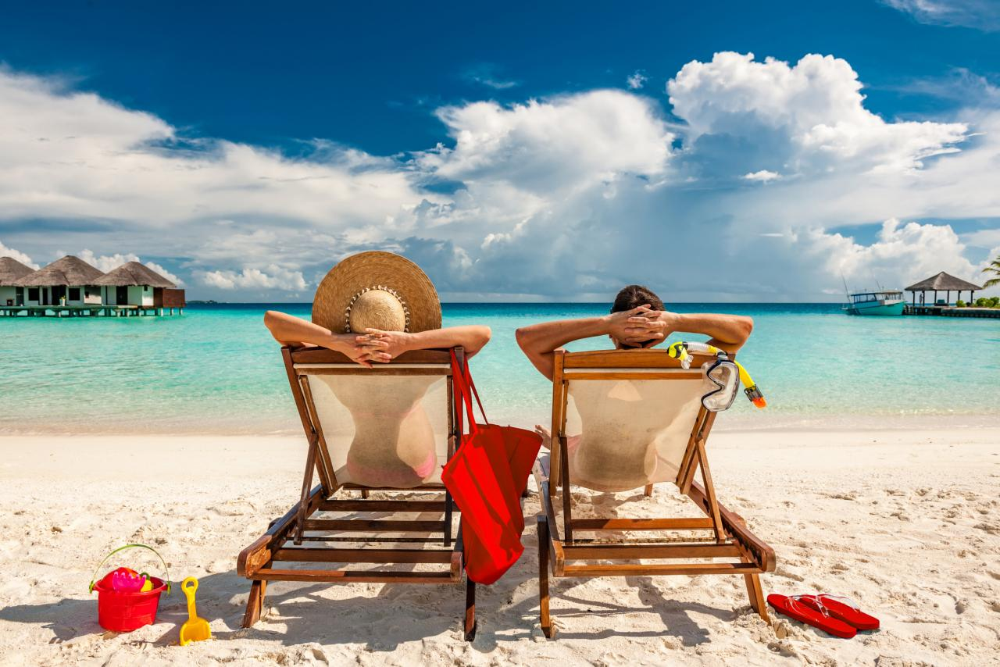
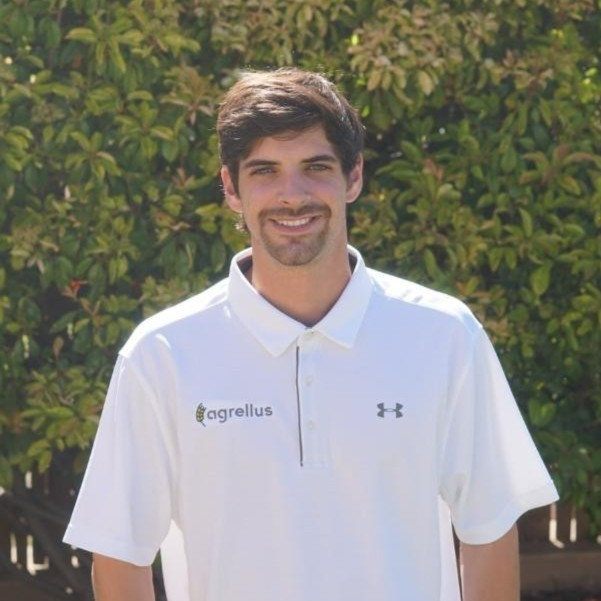
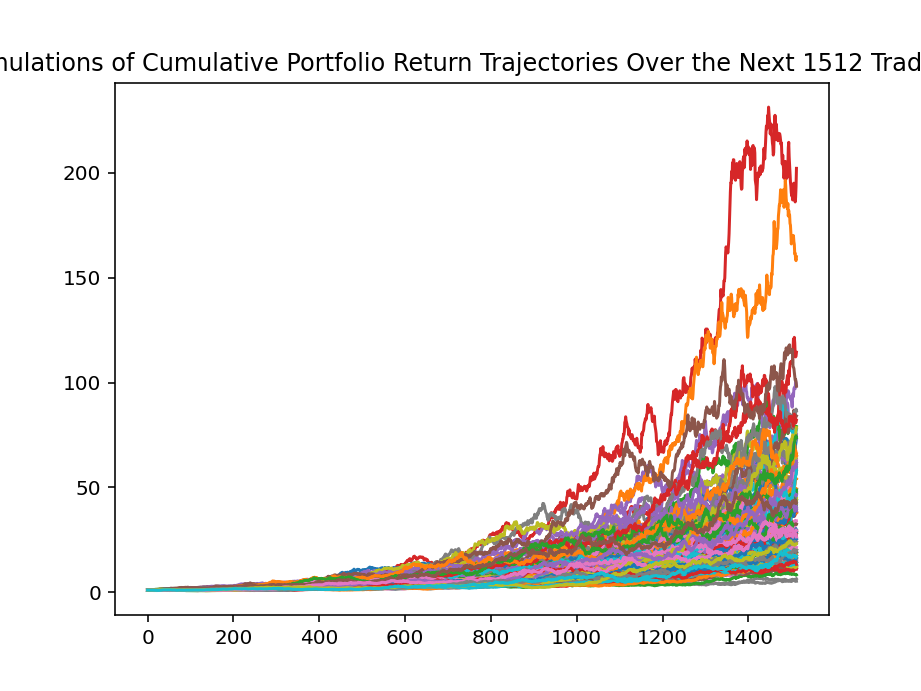
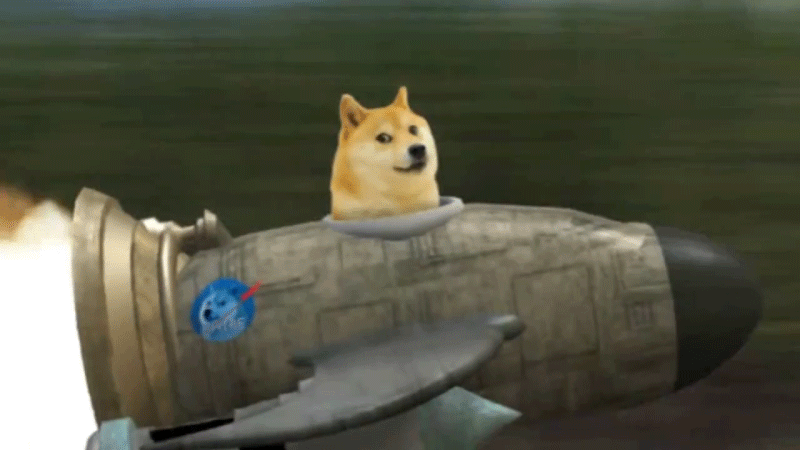
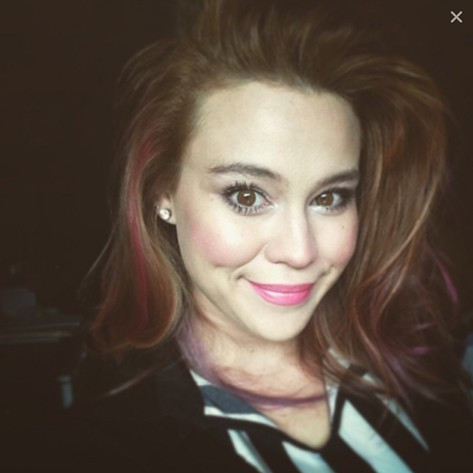
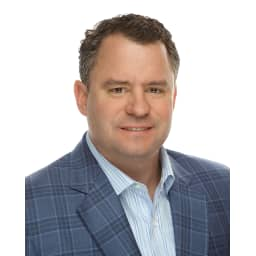

In [123]:
project_dashboard.servable()

# Custom portfolio Risk / Return Calculator

### About The Project




![dashboard]()




### Team 1 Group Members:

* [Jon Iadonisi](https://github.com/Jfrog242)
* [Fai Kongchai](https://github.com/jkongchai)
* [Daniel Faulks](https://github.com/Danebob86)
* [Brock Freeman](https://github.com/Bfree22)



### As cryptocurrency becomes more mainstream and investors and institutions allocate more of their money, it becomes even more important to understand the risks of investing in crypto long term. Our risk calculator and custom portfolio analysis allows you to compare the risk and return of a diversified portfolio with cryptocurrency and stock assets. Using this technique, retail traders or crypto analyst can easily run a simulation and portfolio analysis over the stocks or digital assets they choose.


## Questions asked

* How could we make crypto investing less risky for the average person?
* How accurate would our risk / return calcualtions and simulations be?
* How do we get the data?
* Why did we include more crypto assets than stocks?
* Is this program easy enough for the average retail trader to use and understand?
* How were we going to perform the analysis? Which modules would best show the portfolio returns and risk?


### We thought these questions were most important when performing our analysis and calculations because our main objective was to help retail investors see the risk / return of their own portfolio with an easy to use dashboard to see the results on. We thought choosing 6 crypto assets and 3 stock indeces was the best way to show the potential volatility of a diversified portfolio. Our risk slider, and input functions makes it easy for the user select their investment amount, investment time period, while also adjusting their risk level using the risk slider.






## Questions & Data

* To find our data we used the yfinance library to retrieve the historical price data from the selected cryptocurrencies and stock indeces. 

![library-gif]()

* Import yfinance
  ```
  import yfinance as yf
  ```
  
  ## Data Cleaning
  
  * We cleaned the data by getting the prices from yfinance API, and using Pandas library to drop null values and sort the index by datetime. While cleaning the data, we noticed that most of the cryptos had null values due to them being around 2-3 years old. Some insights when getting the data were the correlation between the price changes going back to 5 years. Many cryptocurrencies have related price action. 
  
  
  

  [drop_values](2021-06-08_19.47.08.gif) 



  
## Data Analysis

#### The following analysis modules were performed to calculate the volatility, correlation, annual returns, and projected simulated returns of the custom portfolio.

  * Correlation (Heatmap)
  * Volatility
  * Covariance
  * Sharpe Ratio
  * Weighted Portfolio
  * Monte Carlo Simulation
  


### Correlation (Heatmap)



![heatmap]()


#### According to the heatmap above, our findings resulted in showing the correlation between the crypto and stock assets. You can see that a majority of crypto assets seem to be closely correlated, while the stock indeces are no where near correlation with the crypto assets.




### Volatility (Histogram)


[histogram](Screen%20Shot%202021-06-07%20at%204.59.51%20PM.png)


#### We can plot out the price returns on a histogram chart. The wider the distribution the more volatile it is. You can see that sp500 is mostly within the mean distribution. But cardano spreads widely across the x-axis. Sometimes the returns can be 10%,15% or 20%. But you will never see a day sp500 up 15%.

#### The full portfolio shows that the volatility of the selected assets are diversified showing crypto assets as the most volatile assets in the portfolio. We can see the volatility level of the crypto assets based on the wideness of the histogram.





### Covariance


[covariance](Screen%20Shot%202021-06-07%20at%205.53.53%20PM.png)



#### Covariance tells us the relationship between the variables. We are trying to find if there is a linear relationship between assets. For example, if bitcoin gains 5%, how do the returns of sp500 correspond to it? Does it also gain 5%? Or does it show no response to it? That is one way to think about covariance. Let’s see their annual. The variance of sp500 is 0.036586. The variance of bitcoin is 0.5960695. The covariance between bitcoin and sp500 is 0.024520 At this point in time, we can only tell that a positive covariance value means there is a positive linear relationship. In order to find the strength of the relationship, we used the correlation function

#### You might ask, why do we need to calculate the covariance or correlation? This is because the volatility of one’s portfolio depends on three things.

* The standard deviation of the individual assets
* Weight of the assets
* Covariance between the assets

#### Hence, the covariance value is one of the inputs that we need to calculate portfolio volatility. The lower the covariance between the two assets, the lower the volatility. This is because they do not move in tandem. Generally speaking, a portfolio of assets that have a high correlation or covariance between one another usually has higher volatility.


### Sharpe Ratio


[Sharpe Ratio](Screen%20Shot%202021-06-07%20at%206.07.11%20PM.png)



#### By finding the sharpe ratio, we were able to find the point where the adjusted-risk return is the highest. The chart above shows a sharpe ratio of 1.22 for a portfolio with 82% Nasdaq and 18% Cardano. 

Discussion
  * Discuss your findings. Did you find what you expected to find? If not, why not? What inferences or general conclusions can you draw from your analysis?
* Postmortem
  * Discuss any difficulties that arose, and how you dealt with them.
  * Discuss any additional questions that came up, but which you didn't have time to answer: What would you research next, if you had two more weeks?
* Questions








## Libraries Used

### Prerequisites

Make sure to install the following libraries and packages before proceeding.

* Import yfinance
  ```
  import yfinance as yf
  ```
  
* Import dash
``` 
import dash
```
* Import pandas
```
import pandas as pd
```
* Import interact
```
from panel.interact import interact
```


### Tools Used

The 5-year historical prices for the selected cryptocurrencies and stock indeces were pulled from the following API's.

* [Yahoo Finance](https://finance.yahoo.com)
* [MCForecastTools]()






## Usage

This project is a great tool for someone wanting to know how to get cryptocurrency or stock price data from an API to build their own dashboard. This project also allows you to compare stocks and crypto assets. The Monte Carlo simulation and Regression modules are some of the most accurate ways of showing potential returns and outcomes for the selected assets. Below you can see the Monte Carlo simulation showing a predicted outcome of your portfolio.



## Contact

Jon -- 202-403-4115 © jon.iadonisi@gmail.com
Fai -- (469) 560-0102 jkongchai@gmail.com 
Daniel - (214)-738-3112 danielfaulks@gmail.com,
Brock -- (806)-790-0683 brockfreeman7@gmail.com 


Project Link: 
[https://github.com/Danebob86/team1_project1](https://github.com/Danebob86/team1_project1)



## Acknowledgements






## Q and A

### Open to questions! 

In [114]:
# panel serve C:\Users\danie\smu_project\team1_project1\crypto_dataframe2.0.ipynb --log-level debug --show

In [115]:
### Example of ideal function

def get_sharpe_ratio(
    df:DataFrame,
    title_name:str
):
    
    '''
    call annual return and give title
    '''
    
    annual_stock=df.hvplot.bar(color="gold",title=f"{title_name} Portfolio Sharpe Ratio")
    return annual_stock

In [116]:
### Example of calling ideal function

get_sharpe_ratio(annual_returns,"Stock")

:Bars   [index]   (0)